In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Image Style Transfer
The Goal for this project is to take two images, one stylised and artistic, the other simple and boring, and turn the latter into an exciting piece of art. All with the help of the magics of CNNs.

In [34]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

# Deprocess the image
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    return vgg

# Get the content and style layers
def get_content_and_style_layers():
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
    return content_layers, style_layers

# Compute the content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Compute the gram matrix
def gram_matrix(input_tensor):
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

# Compute the style loss
def compute_style_loss(base_style, gram_target):
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Compute the total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    style_score = 0
    content_score = 0

    weight_per_style_layer = 1.0 / float(len(gram_style_features))
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * compute_style_loss(comb_style[0], target_style)

    weight_per_content_layer = 1.0 / float(len(content_features))
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * compute_content_loss(comb_content[0], target_content)

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    return loss, style_score, content_score

# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e3, style_weight=1e-2):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img



In [35]:
def visualize_style_transfer(content_path, style_path):
    """
    Perform style transfer and visualize the content, style, and output images.

    Parameters:
        content_path (str): Path to the content image.
        style_path (str): Path to the style image.

    Returns:
        None
    """
    # Perform style transfer
    output_image = style_transfer(content_path, style_path)

    # Load the content and style images
    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    # Deprocess the images for visualization
    content_image = deprocess_image(content_image)
    style_image = deprocess_image(style_image)

    # Plot the images
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.title('Content Image')
    plt.imshow(content_image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Style Image')
    plt.imshow(style_image)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Output Image')
    plt.imshow(output_image)
    plt.axis('off')

    plt.show()



Iteration: 0, Total loss: 144928928.0, Style loss: 144928928.0, Content loss: 0.0
Iteration: 100, Total loss: 8634820.0, Style loss: 6564680.0, Content loss: 2070140.375
Iteration: 200, Total loss: 4765362.5, Style loss: 3145870.25, Content loss: 1619492.25
Iteration: 300, Total loss: 3255974.25, Style loss: 1947132.0, Content loss: 1308842.25
Iteration: 400, Total loss: 2543958.0, Style loss: 1440953.375, Content loss: 1103004.625
Iteration: 500, Total loss: 2155495.0, Style loss: 1170086.125, Content loss: 985408.875
Iteration: 600, Total loss: 1931706.0, Style loss: 1018776.125, Content loss: 912929.875
Iteration: 700, Total loss: 1790293.75, Style loss: 923740.5625, Content loss: 866553.125
Iteration: 800, Total loss: 1690128.0, Style loss: 857662.0, Content loss: 832466.0625
Iteration: 900, Total loss: 1615475.625, Style loss: 807268.5625, Content loss: 808207.0625


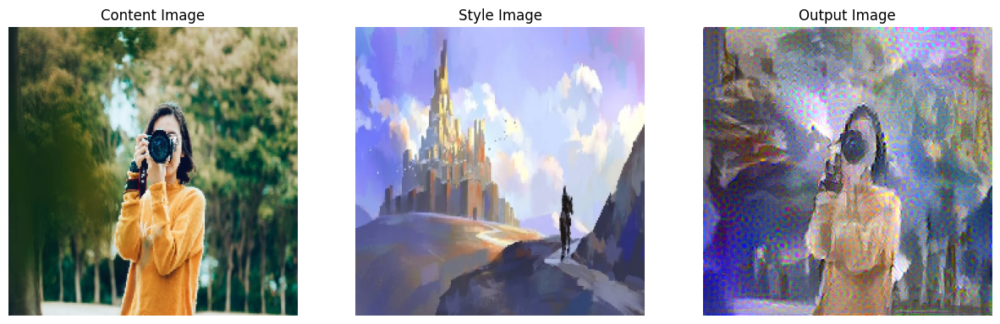

In [36]:
# Example usage
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 5360638976.0, Style loss: 5360638976.0, Content loss: 0.0
Iteration: 100, Total loss: 85083624.0, Style loss: 78281536.0, Content loss: 6802089.5
Iteration: 200, Total loss: 40636040.0, Style loss: 34130156.0, Content loss: 6505884.0
Iteration: 300, Total loss: 25448422.0, Style loss: 19379278.0, Content loss: 6069144.0
Iteration: 400, Total loss: 18462032.0, Style loss: 12936036.0, Content loss: 5525996.0
Iteration: 500, Total loss: 15084158.0, Style loss: 9951460.0, Content loss: 5132698.5
Iteration: 600, Total loss: 13095838.0, Style loss: 8296226.5, Content loss: 4799612.0
Iteration: 700, Total loss: 11810516.0, Style loss: 7276670.0, Content loss: 4533846.5
Iteration: 800, Total loss: 10894784.0, Style loss: 6560752.0, Content loss: 4334032.5
Iteration: 900, Total loss: 10218226.0, Style loss: 6042835.5, Content loss: 4175390.25


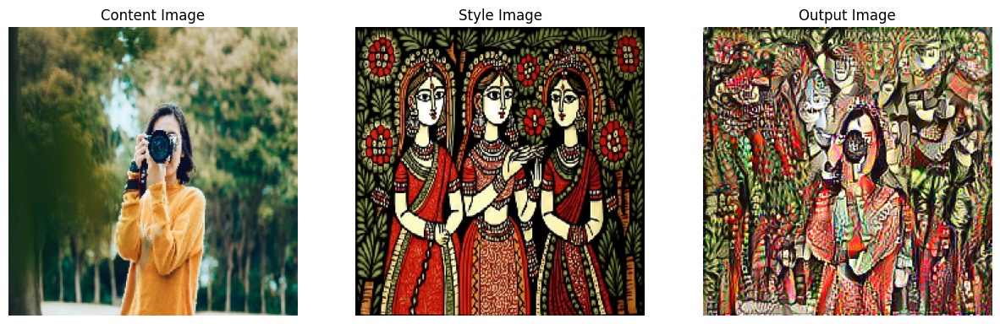

In [37]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 667286080.0, Style loss: 667286080.0, Content loss: 0.0
Iteration: 100, Total loss: 13928970.0, Style loss: 10383776.0, Content loss: 3545193.5
Iteration: 200, Total loss: 7479702.0, Style loss: 4451164.5, Content loss: 3028537.5
Iteration: 300, Total loss: 4826037.0, Style loss: 2265276.0, Content loss: 2560760.75
Iteration: 400, Total loss: 3625911.5, Style loss: 1457962.875, Content loss: 2167948.5
Iteration: 500, Total loss: 2991578.25, Style loss: 1115922.875, Content loss: 1875655.375
Iteration: 600, Total loss: 2603074.0, Style loss: 956805.4375, Content loss: 1646268.5
Iteration: 700, Total loss: 2353548.25, Style loss: 856492.4375, Content loss: 1497055.875
Iteration: 800, Total loss: 2181628.0, Style loss: 791214.3125, Content loss: 1390413.75
Iteration: 900, Total loss: 2056483.5, Style loss: 739105.5625, Content loss: 1317377.875


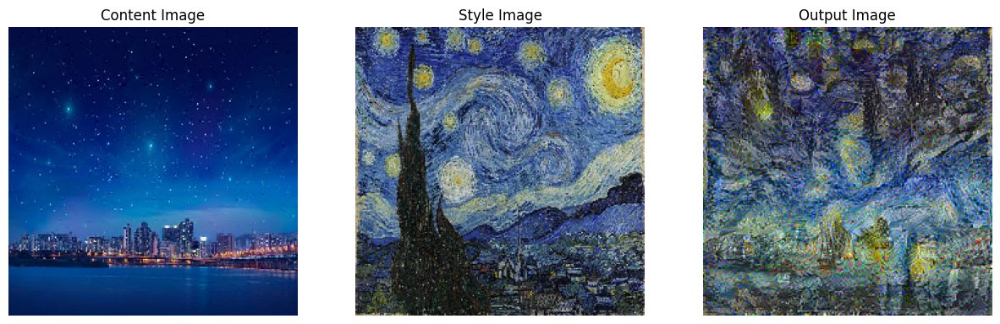

In [38]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

## Initial observations
The images do seem take on the Style of the images being fed to them, but the style isn't applied all that clearly, nor does it seem interesting. Perhaps we can fine tune this so that it can do this in a manner that seems more intentional.

Going to try and increase the content weight, and decrease the style weight to see if that yeilds better results

In [47]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

# Deprocess the image
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    return vgg

# Get the content and style layers
def get_content_and_style_layers():
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
    return content_layers, style_layers

# Compute the content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Compute the gram matrix
def gram_matrix(input_tensor):
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

# Compute the style loss
def compute_style_loss(base_style, gram_target):
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Compute the total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    style_score = 0
    content_score = 0

    weight_per_style_layer = 1.0 / float(len(gram_style_features))
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * compute_style_loss(comb_style[0], target_style)

    weight_per_content_layer = 1.0 / float(len(content_features))
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * compute_content_loss(comb_content[0], target_content)

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    return loss, style_score, content_score

# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e4, style_weight=1e-3):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img



Iteration: 0, Total loss: 536063968.0, Style loss: 536063968.0, Content loss: 0.0
Iteration: 100, Total loss: 23466576.0, Style loss: 10578060.0, Content loss: 12888517.0
Iteration: 200, Total loss: 14673832.0, Style loss: 6270749.0, Content loss: 8403083.0
Iteration: 300, Total loss: 11288527.0, Style loss: 4718967.5, Content loss: 6569559.5
Iteration: 400, Total loss: 9493577.0, Style loss: 3935454.75, Content loss: 5558122.0
Iteration: 500, Total loss: 8413178.0, Style loss: 3506594.5, Content loss: 4906583.0
Iteration: 600, Total loss: 7742767.0, Style loss: 3252993.75, Content loss: 4489773.0
Iteration: 700, Total loss: 7289523.0, Style loss: 3068949.75, Content loss: 4220573.0
Iteration: 800, Total loss: 6970605.0, Style loss: 2948088.5, Content loss: 4022516.75
Iteration: 900, Total loss: 6741017.0, Style loss: 2864005.5, Content loss: 3877011.5


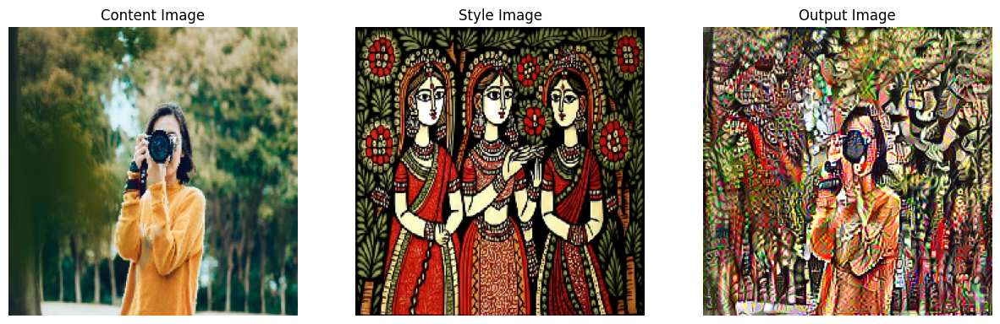

In [40]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 66728612.0, Style loss: 66728612.0, Content loss: 0.0
Iteration: 100, Total loss: 5814870.5, Style loss: 2201657.0, Content loss: 3613213.5
Iteration: 200, Total loss: 4006630.5, Style loss: 1520108.625, Content loss: 2486522.0
Iteration: 300, Total loss: 3186041.5, Style loss: 1210478.125, Content loss: 1975563.375
Iteration: 400, Total loss: 2758218.75, Style loss: 1056601.0, Content loss: 1701617.75
Iteration: 500, Total loss: 2507073.75, Style loss: 961342.1875, Content loss: 1545731.625
Iteration: 600, Total loss: 2341406.0, Style loss: 901774.375, Content loss: 1439631.75
Iteration: 700, Total loss: 2232252.5, Style loss: 862057.875, Content loss: 1370194.5
Iteration: 800, Total loss: 2155138.5, Style loss: 835702.4375, Content loss: 1319436.0
Iteration: 900, Total loss: 2099087.0, Style loss: 815462.0625, Content loss: 1283625.0


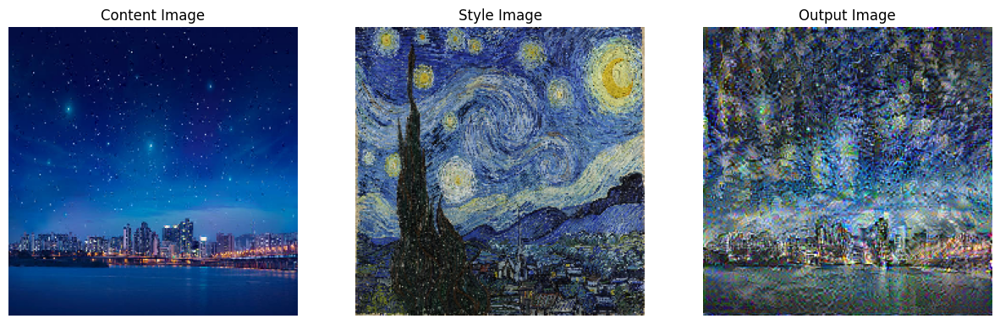

In [41]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 29895430.0, Style loss: 29895430.0, Content loss: 0.0
Iteration: 100, Total loss: 3837351.5, Style loss: 1906090.375, Content loss: 1931261.125
Iteration: 200, Total loss: 2634354.75, Style loss: 1298530.5, Content loss: 1335824.25
Iteration: 300, Total loss: 2173280.0, Style loss: 1079346.0, Content loss: 1093934.0
Iteration: 400, Total loss: 1937080.5, Style loss: 969479.5625, Content loss: 967601.0
Iteration: 500, Total loss: 1801267.25, Style loss: 910091.4375, Content loss: 891175.75
Iteration: 600, Total loss: 1720515.625, Style loss: 869972.875, Content loss: 850542.75
Iteration: 700, Total loss: 1670988.25, Style loss: 847647.3125, Content loss: 823341.0
Iteration: 800, Total loss: 1636741.25, Style loss: 833227.8125, Content loss: 803513.4375
Iteration: 900, Total loss: 1613518.75, Style loss: 820824.0, Content loss: 792694.75


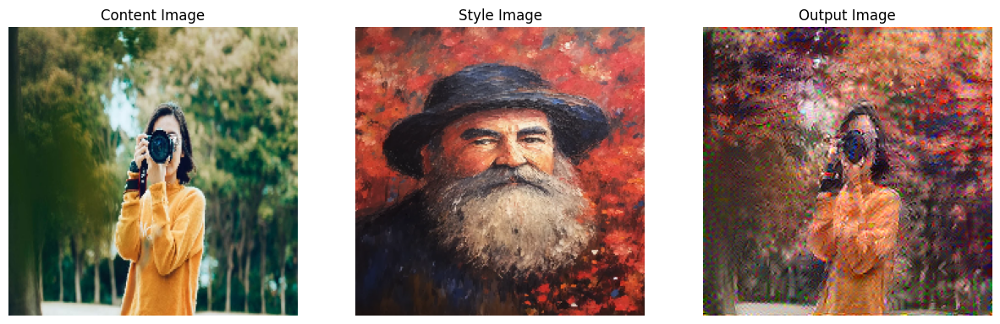

In [48]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/portraits.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 14492894.0, Style loss: 14492894.0, Content loss: 0.0
Iteration: 100, Total loss: 2999803.5, Style loss: 1945389.125, Content loss: 1054414.375
Iteration: 200, Total loss: 2061455.25, Style loss: 1283248.875, Content loss: 778206.3125
Iteration: 300, Total loss: 1663529.625, Style loss: 1000630.9375, Content loss: 662898.6875
Iteration: 400, Total loss: 1462826.75, Style loss: 859931.0625, Content loss: 602895.625
Iteration: 500, Total loss: 1354182.75, Style loss: 784606.4375, Content loss: 569576.375
Iteration: 600, Total loss: 1286611.25, Style loss: 739586.0625, Content loss: 547025.25
Iteration: 700, Total loss: 1242869.125, Style loss: 710891.5625, Content loss: 531977.5625
Iteration: 800, Total loss: 1213855.625, Style loss: 690224.625, Content loss: 523630.96875
Iteration: 900, Total loss: 1190608.75, Style loss: 674926.25, Content loss: 515682.5


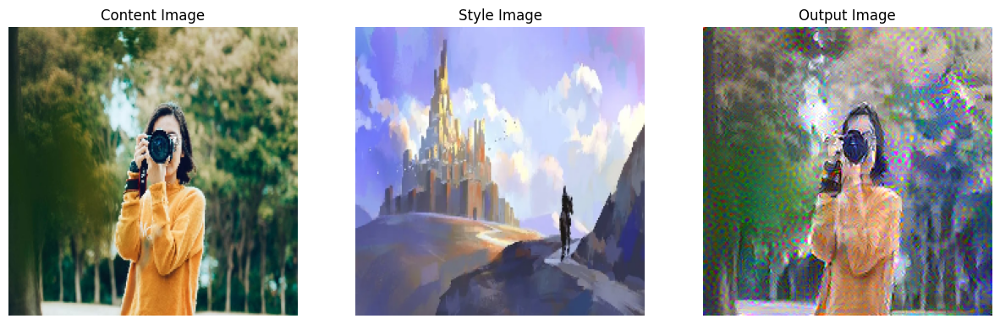

In [49]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Okayyy, that looks amazing

Let's try the opposite, just for fun

In [42]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

# Deprocess the image
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    return vgg

# Get the content and style layers
def get_content_and_style_layers():
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
    return content_layers, style_layers

# Compute the content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Compute the gram matrix
def gram_matrix(input_tensor):
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

# Compute the style loss
def compute_style_loss(base_style, gram_target):
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Compute the total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    style_score = 0
    content_score = 0

    weight_per_style_layer = 1.0 / float(len(gram_style_features))
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * compute_style_loss(comb_style[0], target_style)

    weight_per_content_layer = 1.0 / float(len(content_features))
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * compute_content_loss(comb_content[0], target_content)

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    return loss, style_score, content_score

# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e2, style_weight=1e-3):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img



Iteration: 0, Total loss: 536063968.0, Style loss: 536063968.0, Content loss: 0.0
Iteration: 100, Total loss: 8471447.0, Style loss: 7790841.5, Content loss: 680605.875
Iteration: 200, Total loss: 4092282.25, Style loss: 3448657.0, Content loss: 643625.25
Iteration: 300, Total loss: 2561267.0, Style loss: 1969925.125, Content loss: 591341.875
Iteration: 400, Total loss: 1881113.875, Style loss: 1335597.0, Content loss: 545516.875
Iteration: 500, Total loss: 1519574.625, Style loss: 1018579.6875, Content loss: 500994.9375
Iteration: 600, Total loss: 1310069.375, Style loss: 844502.5625, Content loss: 465566.84375
Iteration: 700, Total loss: 1176222.75, Style loss: 734315.125, Content loss: 441907.65625
Iteration: 800, Total loss: 1082633.75, Style loss: 660432.875, Content loss: 422200.875
Iteration: 900, Total loss: 1013437.5, Style loss: 607181.5, Content loss: 406256.03125


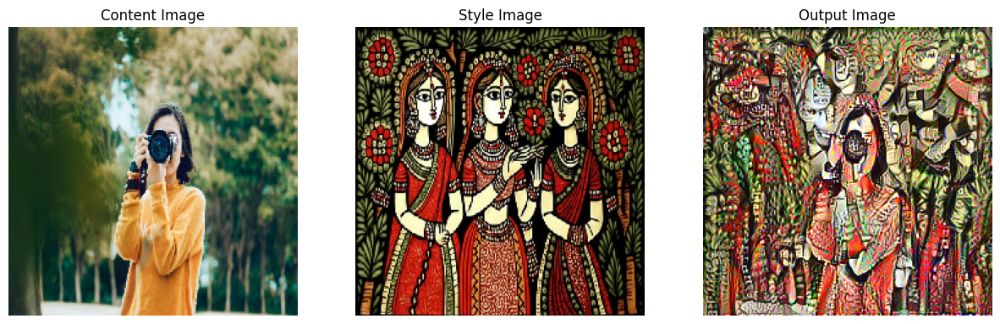

In [43]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 66728612.0, Style loss: 66728612.0, Content loss: 0.0
Iteration: 100, Total loss: 1392175.0, Style loss: 1037845.4375, Content loss: 354329.625
Iteration: 200, Total loss: 753448.375, Style loss: 447502.46875, Content loss: 305945.9375
Iteration: 300, Total loss: 487824.21875, Style loss: 229679.34375, Content loss: 258144.875
Iteration: 400, Total loss: 366256.3125, Style loss: 145855.296875, Content loss: 220401.03125
Iteration: 500, Total loss: 302158.0, Style loss: 111684.8984375, Content loss: 190473.109375
Iteration: 600, Total loss: 263069.96875, Style loss: 95332.0546875, Content loss: 167737.921875
Iteration: 700, Total loss: 237445.78125, Style loss: 85832.09375, Content loss: 151613.6875
Iteration: 800, Total loss: 219779.15625, Style loss: 79012.0390625, Content loss: 140767.125
Iteration: 900, Total loss: 207296.34375, Style loss: 73817.0859375, Content loss: 133479.265625


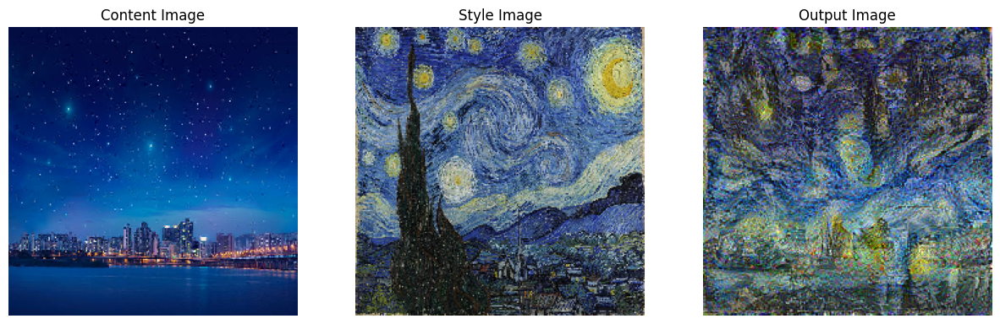

In [44]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 29895430.0, Style loss: 29895430.0, Content loss: 0.0
Iteration: 100, Total loss: 911949.0, Style loss: 579710.125, Content loss: 332238.84375
Iteration: 200, Total loss: 490755.4375, Style loss: 260732.015625, Content loss: 230023.4375
Iteration: 300, Total loss: 333989.3125, Style loss: 159485.703125, Content loss: 174503.59375
Iteration: 400, Total loss: 261443.734375, Style loss: 121723.390625, Content loss: 139720.34375
Iteration: 500, Total loss: 223495.375, Style loss: 102611.2265625, Content loss: 120884.140625
Iteration: 600, Total loss: 201904.5, Style loss: 91536.59375, Content loss: 110367.90625
Iteration: 700, Total loss: 188846.46875, Style loss: 84761.15625, Content loss: 104085.3125
Iteration: 800, Total loss: 179948.4375, Style loss: 80206.6015625, Content loss: 99741.828125
Iteration: 900, Total loss: 173654.796875, Style loss: 76938.0, Content loss: 96716.796875


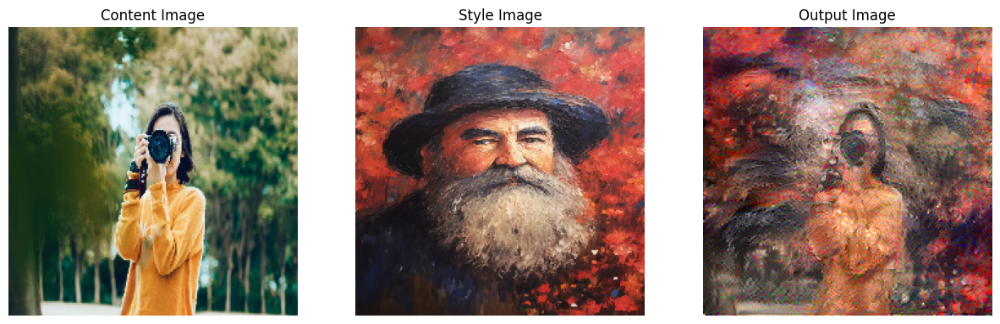

In [45]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/portraits.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 14492894.0, Style loss: 14492894.0, Content loss: 0.0
Iteration: 100, Total loss: 874724.8125, Style loss: 667182.375, Content loss: 207542.453125
Iteration: 200, Total loss: 480595.25, Style loss: 317684.3125, Content loss: 162910.921875
Iteration: 300, Total loss: 329759.84375, Style loss: 196467.46875, Content loss: 133292.375
Iteration: 400, Total loss: 258173.9375, Style loss: 146005.40625, Content loss: 112168.53125
Iteration: 500, Total loss: 219565.53125, Style loss: 120014.5234375, Content loss: 99551.015625
Iteration: 600, Total loss: 196996.21875, Style loss: 104901.125, Content loss: 92095.1015625
Iteration: 700, Total loss: 182044.1875, Style loss: 95570.203125, Content loss: 86473.984375
Iteration: 800, Total loss: 171274.578125, Style loss: 88570.734375, Content loss: 82703.84375
Iteration: 900, Total loss: 163244.0625, Style loss: 83413.40625, Content loss: 79830.65625


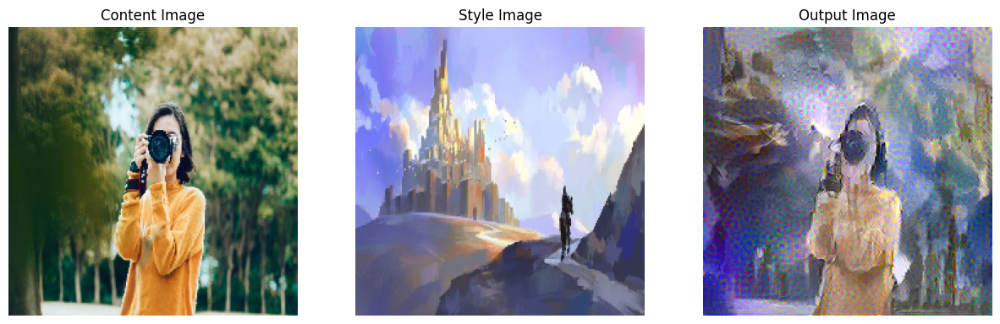

In [46]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Looks more stylised, but the clarity of the orignal is getting lost.

Either are good results, and the difference in loss can be altered for artistic preference.